In [1]:
import pandas as pd
import numpy as np

In [2]:
embs_df = pd.read_pickle('news_df_processed.pkl')

In [3]:
embs_df['date'].max()

'2025-04-28'

In [4]:
from transformers import pipeline

# Загрузка русскоязычной модели для анализа тональности
sentiment_analyzer = pipeline(
model = pipeline(model="r1char9/rubert-base-cased-russian-sentiment")
)



/Users/admoskalenko/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Device set to use cpu


RuntimeError: Inferring the task automatically requires to check the hub with a model_id defined as a `str`. <transformers.pipelines.text_classification.TextClassificationPipeline object at 0x118fc9ac0> is not a valid model_id.

In [ ]:
model("Привет, ты мне нравишься!")

In [7]:
embs_df['text'][79187]

'Фото: Stefan Sauer / Globallookpress.com Платон Щукин Власти США объявили о введении санкций в отношении трех судов, которые подозреваются в поставках иранской нефти в порты Йемена, где партии получает движение «Ансар Аллах» (хуситы). Об этом говорится в сообщении на сайте Министерства финансов США. Одним из новых участников санкционного списка стал танкер Maisan, ходящий под флагом Панамы. В ведомстве подчеркнули, что еще с 2023 года он был задействован для экспорта российской нефти и нефтепродуктов, то есть был частью теневого флота, используемого для обхода потолка цен на нефть западных стран. Оставшиеся два судна — это Tulip BZ под флагом Сан-Марино и White Whale под флагом Панамы. Санкции стали очередным этапом усиления давления США на Иран и Йемен. Ранее президент США Дональд Трамп на год продлил действие пакета антироссийских санкций, введенного его предшественником Джо Байденом. При этом накануне, 27 апреля, госсекретарь США Марко Рубио объяснил, что Вашингтон пока не расширяе

In [ ]:
sentiment_analyzer('Джо Байден после переговоров с Сенатом. Фото (c)AFP Сенат США поддержал бюджетное соглашение, предотвращающее повышение налогов для большинства граждан страны. Об этом 1 января сообщает Associated Press. Соглашение, достигнутое вечером 31 декабря между вице-президентом США Джозефом Байденом и главой республиканцев в сенате Митчем Макконнеллом, предусматривает рост налогов только для американцев, чей годовой доход превышает 400 тысяч долларов (450 тысяч для семей). Если бы соглашение не было одобрено, с 1 января в США автоматически произошел бы "фискальный обрыв". Он предусматривает снижение бюджетных расходов и налоговых льгот на 600 миллиардов долларов суммарно. После одобрения соглашения за его принятие должна проголосовать палата представителей США. Предполагается, что голосование состоится уже 1 января. Как отмечает AP, президент США Барак Обама призвал палату принять соглашение без задержек.')

In [5]:
prepared_df = pd.read_csv('prepared_df.csv', index_col=0)

In [6]:
prepared_df["day_of_week"] = prepared_df['date'].apply(pd.Timestamp).dt.dayofweek
prepared_df["month"] = prepared_df['date'].apply(pd.Timestamp).dt.month
prepared_df.sort_values('date', inplace=True)
prepared_df

,ticker,per,date,time,open,high,low,close,vol,target,...,rsi_14,stoch_k,stoch_d,obv,key_rate,cpi,value,brent_close,day_of_week,month
0,IMOEX,D,2013-09-02,0,1373.12,1373.33,1366.35,1368.52,7.260675e+06,1371.99,...,44.543107,18.481086,18.582154,-1.964995e+08,5.5,6.14,33.2474,112.44,0,9
1,IMOEX,D,2013-09-03,0,1368.52,1384.13,1367.73,1371.99,1.721887e+07,1373.62,...,46.177663,24.606776,18.607495,-1.792807e+08,5.5,6.14,33.2522,113.70,1,9
2,IMOEX,D,2013-09-04,0,1371.99,1375.95,1365.23,1373.62,1.341634e+07,1421.50,...,46.968381,37.206402,26.764754,-1.658643e+08,5.5,6.14,33.3693,113.23,2,9
3,IMOEX,D,2013-09-05,0,1373.62,1423.47,1373.62,1421.50,2.865636e+07,1421.45,...,63.794531,97.092251,52.968476,-1.372080e+08,5.5,6.14,33.4656,113.70,3,9
4,IMOEX,D,2013-09-06,0,1421.50,1448.68,1418.83,1421.45,3.822270e+07,1451.61,...,63.771776,70.707831,68.335495,-1.754307e+08,5.5,6.14,33.3901,114.10,4,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2916,IMOEX,D,2025-04-14,0,2848.99,2856.63,2806.95,2819.69,1.998655e+07,2805.55,...,38.126792,36.735033,34.190418,8.898136e+10,21.0,10.34,84.0040,64.82,0,4
2917,IMOEX,D,2025-04-15,0,2824.64,2836.00,2788.26,2805.55,1.882500e+07,2861.83,...,37.263665,39.336213,38.169321,8.896253e+10,21.0,10.34,82.7671,64.67,1,4
2918,IMOEX,D,2025-04-16,0,2801.01,2870.39,2790.70,2861.83,2.206011e+07,2865.32,...,42.812885,54.401026,43.490758,8.898459e+10,21.0,10.34,82.3003,65.85,2,4
2919,IMOEX,D,2025-04-17,0,2863.20,2884.76,2844.33,2865.32,2.209345e+07,2872.77,...,43.148707,59.829808,51.189016,8.900669e+10,21.0,10.34,82.5892,67.96,3,4


In [7]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score, mean_absolute_error as mae
from sklearn.metrics import roc_auc_score as roc_auc, mean_absolute_percentage_error as mape, r2_score, accuracy_score
from torch.utils.tensorboard import SummaryWriter

def train_regressor(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        all_labels = []
        all_outputs = []

        for X_batch, X_news_batch, y_batch in train_loader:
            optimizer.zero_grad()
            outputs = model(X_batch, X_news_batch).squeeze(1)
            loss = criterion(outputs, y_batch.squeeze(1).float())
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            all_labels.extend(y_batch.cpu().numpy())
            all_outputs.extend(outputs.detach().cpu().numpy())

        train_mape = mape(all_labels, all_outputs)
        train_mae = mae(all_labels, all_outputs)
        train_r2 = r2_score(all_labels, all_outputs)

        # Валидация
        val_mape, val_r2, val_mae, naive_mape, naive_r2, naive_mae, val_loss = evaluate_regressor(model, val_loader, criterion)
        writer.add_scalar('Loss/Train', total_loss/len(train_loader), epoch)
        writer.add_scalar('Loss/Val', val_loss, epoch)
        writer.add_scalar('MAPE/Train', train_mape, epoch)
        writer.add_scalar('R2/Val', val_r2, epoch)
        writer.add_scalar('R2/Train', train_r2, epoch)
        writer.add_scalar('MAPE/Val', val_mape, epoch,)
        writer.add_scalar('MAE/Train', train_mae, epoch)
        writer.add_scalar('MAE/Val', val_mae, epoch,)

        print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(train_loader):.4f}, "
              f"Train MAPE: {train_mape:.4f}, Val MAPE: {val_mape:.4f},"
              f"Train R2: {train_r2:.4f}, Val R2: {val_r2:.4f},"
              f"Train MAE: {train_mae:.4f}, Val MAE: {val_mae:.4f}, "
              f"naive mape: {naive_mape:.4f}, naive R2: {naive_r2:.4f}, naive MAE: {naive_mae:.4f}")

def evaluate_regressor(model, loader, criterion):
    model.eval()
    total_loss = 0
    all_labels = []
    all_outputs = []
    with torch.no_grad():
        for X_batch, X_news_batch, y_batch in loader:
            outputs = model(X_batch, X_news_batch).squeeze(1)
            all_outputs.extend(outputs.cpu().numpy())
            loss = criterion(outputs, y_batch.squeeze(1).float())
            total_loss += loss.item()
            all_labels.extend(y_batch.cpu().numpy())
    
    mape_score = mape(all_labels, all_outputs)
    r2 = r2_score(all_labels, all_outputs)
    mae_score = mae(all_labels, all_outputs)
    return mape_score, r2, mae_score, mape(all_labels[1:], all_labels[:-1]), r2_score(all_labels[1:], all_labels[:-1]), mae(all_labels[1:], all_labels[:-1]), total_loss/len(loader)


In [29]:
import torch


embs_df = embs_df.groupby('date').apply(lambda x: (x['label'] * x['score']).sum()).reset_index(name='sentiment')


KeyError: 'label'

In [30]:
embs_agg_df = embs_df.reset_index(name='sentiment')
embs_agg_df

,date,sentiment
0,2013-01-01,0.000000
1,2013-01-02,0.000000
2,2013-01-03,-0.529085
3,2013-01-04,-0.572864
4,2013-01-07,-0.626744
...,...,...
3877,2025-04-24,-0.185689
3878,2025-04-25,-1.097708
3879,2025-04-26,0.000000
3880,2025-04-27,0.000000


In [9]:
embs_agg_df = embs_df.groupby('date')['embedding'].apply(tuple).apply(lambda x: torch.stack(x).mean(dim=0)).reset_index()

In [10]:
embs_agg_df

,date,embedding
0,2013-01-01,"[tensor(-0.0170), tensor(0.2611), tensor(0.148..."
1,2013-01-02,"[tensor(-0.0111), tensor(0.4684), tensor(-0.13..."
2,2013-01-03,"[tensor(-0.0085), tensor(0.0321), tensor(0.066..."
3,2013-01-04,"[tensor(-0.0768), tensor(0.0290), tensor(-0.05..."
4,2013-01-07,"[tensor(-0.0507), tensor(-0.0664), tensor(0.28..."
...,...,...
3877,2025-04-24,"[tensor(-0.1184), tensor(-0.0823), tensor(0.20..."
3878,2025-04-25,"[tensor(-0.1118), tensor(0.0074), tensor(0.127..."
3879,2025-04-26,"[tensor(-0.0658), tensor(0.0388), tensor(0.223..."
3880,2025-04-27,"[tensor(0.0928), tensor(0.1361), tensor(0.3891..."


In [31]:
aggs_df = pd.merge(prepared_df, embs_agg_df, on='date')

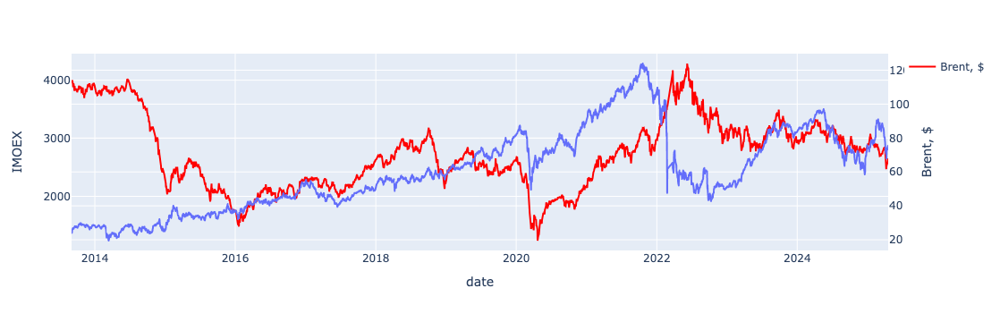

In [32]:
import plotly.express as px

fig = px.line(aggs_df.rename({'close': 'IMOEX'}, axis=1), x='date', y='IMOEX')

# Добавляем вторую линию с правой осью Y
fig.add_scatter(
    x=aggs_df['date'], 
    y=aggs_df['brent_close'], 
    name='Brent, $',
    line=dict(color='red'),
    yaxis='y2'  # указываем, что используем вторую ось Y
)

# Настраиваем оси
fig.update_layout(
    yaxis2=dict(
        title='Brent, $',
        overlaying='y',  # накладываем на первую ось
        side='right',    # размещаем справа
    )
)

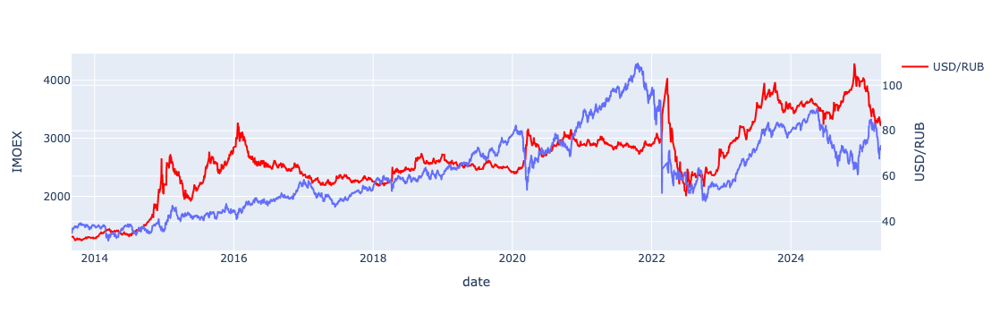

In [33]:
import plotly.express as px

fig = px.line(aggs_df.rename({'close': 'IMOEX'}, axis=1), x='date', y='IMOEX')

# Добавляем вторую линию с правой осью Y
fig.add_scatter(
    x=aggs_df['date'], 
    y=aggs_df['value'], 
    name='USD/RUB',
    line=dict(color='red'),
    yaxis='y2'  # указываем, что используем вторую ось Y
)

# Настраиваем оси
fig.update_layout(
    yaxis2=dict(
        title='USD/RUB',
        overlaying='y',  # накладываем на первую ось
        side='right',    # размещаем справа
    )
)

In [52]:
np.corrcoef(aggs_df[aggs_df['date']>= '2022-02-24']['sentiment_30d'], aggs_df[aggs_df['date']>= '2022-02-24']['close'])

array([[1.        , 0.57187801],
       [0.57187801, 1.        ]])

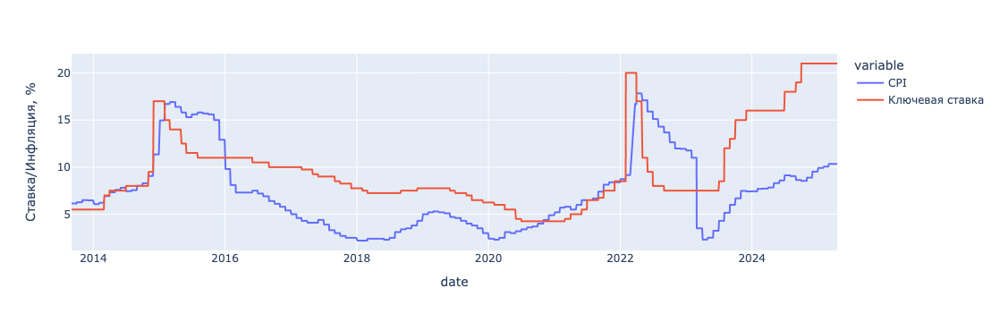

In [73]:
import plotly.express as px

fig = px.line(aggs_df.rename({'cpi': 'CPI', 'key_rate': 'Ключевая ставка'}, axis=1), x='date', y=['CPI', 'Ключевая ставка'])

fig.update_layout(
    yaxis=dict(
        title='Ставка/Инфляция, %',
        overlaying='y',  # накладываем на первую ось
        side='left',    # размещаем справа
    )
)

In [35]:
aggs_df

,ticker,per,date,time,open,high,low,close,vol,target,...,stoch_k,stoch_d,obv,key_rate,cpi,value,brent_close,day_of_week,month,sentiment
0,IMOEX,D,2013-09-02,0,1373.12,1373.33,1366.35,1368.52,7.260675e+06,1371.99,...,18.481086,18.582154,-1.964995e+08,5.5,6.14,33.2474,112.44,0,9,-0.495464
1,IMOEX,D,2013-09-03,0,1368.52,1384.13,1367.73,1371.99,1.721887e+07,1373.62,...,24.606776,18.607495,-1.792807e+08,5.5,6.14,33.2522,113.70,1,9,-0.525408
2,IMOEX,D,2013-09-04,0,1371.99,1375.95,1365.23,1373.62,1.341634e+07,1421.50,...,37.206402,26.764754,-1.658643e+08,5.5,6.14,33.3693,113.23,2,9,-2.705846
3,IMOEX,D,2013-09-05,0,1373.62,1423.47,1373.62,1421.50,2.865636e+07,1421.45,...,97.092251,52.968476,-1.372080e+08,5.5,6.14,33.4656,113.70,3,9,-0.498122
4,IMOEX,D,2013-09-06,0,1421.50,1448.68,1418.83,1421.45,3.822270e+07,1451.61,...,70.707831,68.335495,-1.754307e+08,5.5,6.14,33.3901,114.10,4,9,0.746296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,IMOEX,D,2025-04-14,0,2848.99,2856.63,2806.95,2819.69,1.998655e+07,2805.55,...,36.735033,34.190418,8.898136e+10,21.0,10.34,84.0040,64.82,0,4,-1.335508
2887,IMOEX,D,2025-04-15,0,2824.64,2836.00,2788.26,2805.55,1.882500e+07,2861.83,...,39.336213,38.169321,8.896253e+10,21.0,10.34,82.7671,64.67,1,4,-1.851201
2888,IMOEX,D,2025-04-16,0,2801.01,2870.39,2790.70,2861.83,2.206011e+07,2865.32,...,54.401026,43.490758,8.898459e+10,21.0,10.34,82.3003,65.85,2,4,-1.156469
2889,IMOEX,D,2025-04-17,0,2863.20,2884.76,2844.33,2865.32,2.209345e+07,2872.77,...,59.829808,51.189016,8.900669e+10,21.0,10.34,82.5892,67.96,3,4,-1.257384


In [38]:
aggs_df['sentiment'].rolling(7).mean()

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
          ...   
2886   -2.515469
2887   -2.165526
2888   -1.860840
2889   -1.363089
2890   -1.044026
Name: sentiment, Length: 2891, dtype: float64

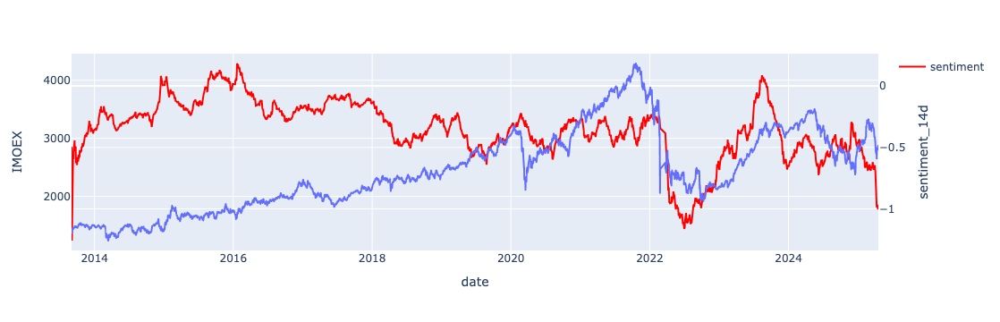

In [85]:
import plotly.express as px
aggs_df['sentiment_30d'] = aggs_df['sentiment'].ewm(span=90).mean()

fig = px.line(aggs_df.rename({'close': 'IMOEX'}, axis=1), x='date', y='IMOEX')

# Добавляем вторую линию с правой осью Y
fig.add_scatter(
    x=aggs_df['date'], 
    y=aggs_df['sentiment_30d'], 
    name='sentiment',
    line=dict(color='red'),
    yaxis='y2'  # указываем, что используем вторую ось Y
)

# Настраиваем оси
fig.update_layout(
    yaxis2=dict(
        title='sentiment_14d',
        overlaying='y',  # накладываем на первую ось
        side='right',    # размещаем справа
    )
)

In [61]:
aggs_df['month'] = pd.to_datetime(aggs_df['date']).dt.to_period('M')
monthly_data = aggs_df.groupby('month')['vol'].sum().reset_index()


In [63]:
monthly_data['month'] = monthly_data['month'].apply(str)

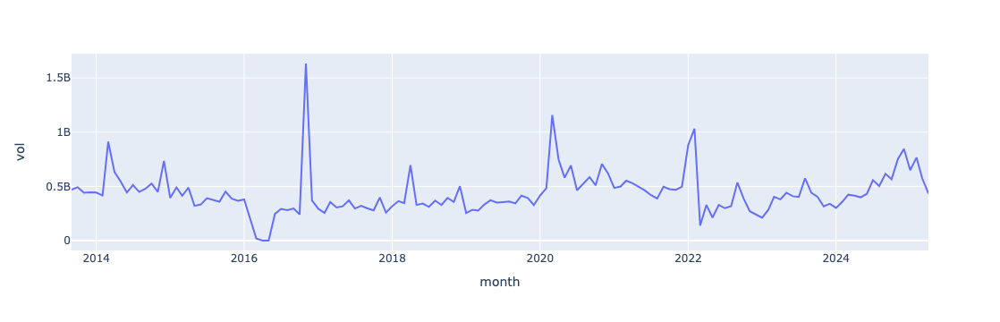

In [66]:
px.line(monthly_data[monthly_data['vol']< 6e9], x='month', y='vol')

In [90]:
df_for_nn.loc[int(0.9 * len(X)):, :]

,ticker,per,date,time,open,high,low,close,vol,target,...,value,brent_close,day_of_week,month,sentiment,sentiment_7d,sentiment_14d,sentiment_30d,log_return,after_smo
2563,IMOEX,D,2024-01-08,0,3140.12,3158.82,3139.37,0.259733,1.089123e+07,3155.55,...,0.489931,0.087131,0,2024-01,0.000000,-0.365118,-0.680786,-0.194653,8.057878,True
2564,IMOEX,D,2024-01-09,0,3156.17,3158.72,3143.03,0.257746,1.507888e+07,3164.70,...,0.489931,0.110494,1,2024-01,-0.632680,-0.455501,-0.725977,-0.195031,8.056918,True
2565,IMOEX,D,2024-01-10,0,3158.35,3174.28,3156.44,0.263746,1.309551e+07,3181.25,...,0.508285,0.096898,2,2024-01,0.000000,-0.275789,-0.644582,-0.174737,8.059814,True
2566,IMOEX,D,2024-01-11,0,3158.30,3181.25,3148.50,0.274598,2.354917e+07,3185.22,...,0.482381,0.129452,3,2024-01,-1.213280,-0.449115,-0.642133,-0.194517,8.065029,True
2567,IMOEX,D,2024-01-12,0,3182.50,3196.98,3176.09,0.277202,1.814822e+07,3184.88,...,0.466684,0.128878,4,2024-01,-0.712049,-0.460621,-0.594336,-0.197492,8.066277,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,IMOEX,D,2025-04-14,0,2848.99,2856.63,2806.95,0.037517,1.998655e+07,2805.55,...,0.344159,-0.132133,0,2025-04,-1.335508,-2.515469,-1.780665,-0.720871,7.944382,True
2887,IMOEX,D,2025-04-15,0,2824.64,2836.00,2788.26,0.028245,1.882500e+07,2861.83,...,0.312439,-0.135006,1,2025-04,-1.851201,-2.165526,-1.876199,-0.749485,7.939355,True
2888,IMOEX,D,2025-04-16,0,2801.01,2870.39,2790.70,0.065149,2.206011e+07,2865.32,...,0.300468,-0.112409,2,2025-04,-1.156469,-1.860840,-1.908230,-0.754778,7.959217,True
2889,IMOEX,D,2025-04-17,0,2863.20,2884.76,2844.33,0.067437,2.209345e+07,2872.77,...,0.307877,-0.072003,3,2025-04,-1.257384,-1.363089,-1.998043,-0.763251,7.960435,True


In [166]:
df_for_nn = aggs_df.copy()
df_for_nn['log_return'] = np.log(df_for_nn['close'])
df_for_nn['after_smo'] = df_for_nn['date'] >= '2022-02-24'
df_for_nn.dropna(inplace=True)

def create_sequences(data, features, target, window_size=30):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(data[features].values[i:i+window_size])
        y.append(data[target].values[i+window_size])
    return np.array(X), np.array(y)
    
features = ['close', 'brent_close', 'cpi', 'value', 'sentiment']
window_size = 30  # Используем 30 дней истории
from sklearn.preprocessing import MinMaxScaler, RobustScaler
scaler = MinMaxScaler(feature_range=(-1, 1))

df_for_nn[features] = scaler.fit_transform(df_for_nn[features])

X, y = create_sequences(df_for_nn, features, 'is_raised', window_size)


train_size = int(0.9 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Конвертация в тензоры PyTorch
X_train = torch.FloatTensor(X_train)
y_train = torch.FloatTensor(y_train).view(-1, 1)
X_test = torch.FloatTensor(X_test)
y_test = torch.FloatTensor(y_test).view(-1, 1)
from torch.utils.data import Dataset, DataLoader
from torch import nn

class TimeSeriesDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

train_dataset = TimeSeriesDataset(X_train, y_train)
test_dataset = TimeSeriesDataset(X_test, y_test)

batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [167]:
class AttentionLSTMClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_heads):
        super().__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.attention = nn.MultiheadAttention(embed_dim=hidden_size, num_heads=num_heads, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        out, _ = self.lstm(x)
        out, _ = self.attention(out, out, out)  # Механизм внимания
        out = self.fc(out[:, -1, :])
        return self.sigmoid(out)

input_size = features.__len__()
model = AttentionLSTMClassifier(input_size, hidden_size=64, num_layers=2, num_heads=2)

In [168]:
class LSTMBinaryClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers):
        super().__init__()
        self.lstm = nn.LSTM(
            input_size, 
            hidden_size, 
            num_layers, 
            dropout=0.3 if num_layers > 1 else 0,  # Dropout только между слоями
            batch_first=True
        )
        self.dropout = nn.Dropout(0.5)  # Дополнительный dropout
        self.bn = nn.BatchNorm1d(hidden_size)  # BatchNorm
        self.fc = nn.Sequential(
            nn.Linear(hidden_size, hidden_size//2),
            nn.ReLU(),
            nn.Linear(hidden_size//2, 1)
        )
        self.sigmoid = nn.Sigmoid()
        
        # Инициализация весов
        for name, param in self.lstm.named_parameters():
            if 'weight_ih' in name:
                nn.init.xavier_normal_(param)
            elif 'weight_hh' in name:
                nn.init.orthogonal_(param)

    def forward(self, x):
        # Инициализация скрытых состояний
        h0 = torch.zeros(self.lstm.num_layers, x.size(0), self.lstm.hidden_size).to(x.device)
        c0 = torch.zeros(self.lstm.num_layers, x.size(0), self.lstm.hidden_size).to(x.device)
        
        out, _ = self.lstm(x, (h0, c0))
        out = out[:, -1, :]  # берём последний шаг
        out = self.bn(out)
        out = self.dropout(out)
        out = self.fc(out)
        return self.sigmoid(out)

In [170]:
writer = SummaryWriter('logs/exp1/sentiment_just_v19')
model = AttentionLSTMClassifier(input_size, hidden_size=32, num_layers=1, num_heads=1)
criterion = nn.BCELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
train_classifier(model, train_loader, test_loader, criterion, optimizer, epochs=3000)

Epoch 1/3000, Loss: 0.6892, Train Acc: 0.5302, Val Acc: 0.4982, Train F1: 0.6930, Val F1: 0.6651, val ROC-AUC: 0.5628, Val F1: 0.6651, random prediction 0.4982
Epoch 2/3000, Loss: 0.6866, Train Acc: 0.5302, Val Acc: 0.4982, Train F1: 0.6930, Val F1: 0.6651, val ROC-AUC: 0.5804, Val F1: 0.6651, random prediction 0.4982
Epoch 3/3000, Loss: 0.6853, Train Acc: 0.5302, Val Acc: 0.4982, Train F1: 0.6930, Val F1: 0.6651, val ROC-AUC: 0.5806, Val F1: 0.6651, random prediction 0.4982
Epoch 4/3000, Loss: 0.6843, Train Acc: 0.5302, Val Acc: 0.4982, Train F1: 0.6930, Val F1: 0.6651, val ROC-AUC: 0.5802, Val F1: 0.6651, random prediction 0.4982
Epoch 5/3000, Loss: 0.6831, Train Acc: 0.5310, Val Acc: 0.4982, Train F1: 0.6837, Val F1: 0.6651, val ROC-AUC: 0.5829, Val F1: 0.6651, random prediction 0.4982
Epoch 6/3000, Loss: 0.6823, Train Acc: 0.5232, Val Acc: 0.4982, Train F1: 0.6410, Val F1: 0.6651, val ROC-AUC: 0.5873, Val F1: 0.6651, random prediction 0.4982
Epoch 7/3000, Loss: 0.6815, Train Acc: 0

KeyboardInterrupt: 

In [17]:
df_for_nn['embedding'][window_size:].to_list()

[tensor([-1.6952e-02, -2.2862e-02, -6.4647e-02, -8.9395e-02,  1.3791e-01,
          5.4089e-02, -7.2192e-02,  1.3542e-01,  1.2964e-01, -2.1667e-02,
         -5.0777e-02,  1.9886e-01, -1.4124e-01,  6.1192e-02, -1.7649e-03,
          5.7620e-02, -2.2691e-01, -2.0830e-01, -1.5589e-01,  1.8908e-01,
          1.4979e-01,  8.9725e-02, -8.6847e-03,  8.0706e-02,  1.1886e-01,
         -2.6369e-01, -1.9448e-01,  2.9769e-01, -1.5463e-01,  9.5361e-02,
         -4.5610e-01,  2.1263e-01, -1.6790e-01, -3.0291e-01,  3.5417e-01,
         -2.0977e-01,  2.5227e-01,  8.5061e-02,  1.6514e-01, -1.0663e-01,
         -2.1493e-01, -9.8288e-02, -2.6517e-01,  9.7256e-02,  7.0162e-02,
          4.8796e-02,  1.5020e-01, -5.6976e-03,  5.5076e-03, -4.5198e-01,
          8.4990e-01,  1.7670e-01, -2.2880e-01,  2.8547e-01, -2.1406e-01,
         -2.3118e-01,  5.4761e-02,  6.9628e-02,  5.5335e-02,  9.9648e-03,
          3.0177e-02,  3.9960e-01, -1.4586e-01,  3.1464e-01, -4.5341e-02,
         -8.4379e-02,  3.1570e-01, -5.

In [143]:
import torch
import torch.nn as nn

class NewsLSTM(nn.Module):
    def __init__(self, num_ts_features=5, news_embedding_dim=768, lstm_units=64):
        super().__init__()
        
        # Канал для временных рядов (ценовые данные)
        self.ts_lstm = nn.LSTM(
            input_size=num_ts_features,
            hidden_size=lstm_units,
            num_layers=1,
            batch_first=True
        )
        
        # Канал для новостей
        self.news_encoder = nn.Sequential(
            nn.Linear(news_embedding_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, lstm_units)
        )
        
        # Объединяющий классификатор
        self.regressor = nn.Sequential(
            nn.Linear(lstm_units * 2, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 1),
        )

    def forward(self, ts_data, news_data):
        # Обработка временных рядов
        ts_out, _ = self.ts_lstm(ts_data)  # [batch, seq_len, lstm_units]
        ts_features = ts_out[:, -1, :]      # Последний шаг [batch, lstm_units]
        
        # Обработка новостей
        news_features = self.news_encoder(news_data)  # [batch, lstm_units]
        
        # Объединение фичей
        combined = torch.cat([ts_features, news_features], dim=1)
        return self.regressor(combined)

In [147]:
model = NewsLSTM(num_ts_features=features.__len__(), news_embedding_dim=768)

In [150]:
writer = SummaryWriter('logs/exp1/news_embeddings_regression_v1')
model = NewsLSTM(num_ts_features=features.__len__(), news_embedding_dim=768)
criterion = nn.MSELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
train_regressor(model, train_loader, test_loader, criterion, optimizer, epochs=3000)

Epoch 1/3000, Loss: 27.5279, Train MAPE: 0.6095, Val MAPE: 0.1473,Train R2: -335.2594, Val R2: -151.1812,Train MAE: 4.7158, Val MAE: 1.1764, naive mape: 0.0014, naive R2: 0.9770, naive MAE: 0.0108
Epoch 2/3000, Loss: 3.0862, Train MAPE: 0.1850, Val MAPE: 0.0534,Train R2: -35.6583, Val R2: -23.2394,Train MAE: 1.4334, Val MAE: 0.4257, naive mape: 0.0014, naive R2: 0.9770, naive MAE: 0.0108
Epoch 3/3000, Loss: 2.0854, Train MAPE: 0.1507, Val MAPE: 0.0346,Train R2: -23.7681, Val R2: -10.6399,Train MAE: 1.1650, Val MAE: 0.2774, naive mape: 0.0014, naive R2: 0.9770, naive MAE: 0.0108
Epoch 4/3000, Loss: 1.7076, Train MAPE: 0.1344, Val MAPE: 0.0280,Train R2: -19.1988, Val R2: -6.9977,Train MAE: 1.0397, Val MAE: 0.2248, naive mape: 0.0014, naive R2: 0.9770, naive MAE: 0.0108
Epoch 5/3000, Loss: 1.6240, Train MAPE: 0.1329, Val MAPE: 0.0439,Train R2: -18.4904, Val R2: -15.0476,Train MAE: 1.0278, Val MAE: 0.3520, naive mape: 0.0014, naive R2: 0.9770, naive MAE: 0.0108
Epoch 6/3000, Loss: 1.4670, 

In [96]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('logs/exp1/run27')

def train_classifier(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        all_preds = []
        all_labels = []

        for X_batch, y_batch in train_loader:
            optimizer.zero_grad()
            outputs = model(X_batch).squeeze(1)
            loss = criterion(outputs, y_batch.squeeze(1).float())
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            preds = (outputs > 0.5).int()
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())

        train_acc = accuracy_score(all_labels, all_preds)
        train_f1 = f1_score(all_labels, all_preds)

        # Валидация
        val_acc, val_f1, roc_auc, random, val_loss = evaluate_classifier(model, val_loader, criterion)
        writer.add_scalar('Loss/Train', total_loss/len(train_loader), epoch)
        writer.add_scalar('Loss/Val', val_loss, epoch)
        writer.add_scalar('Acc/Train', train_acc, epoch)
        writer.add_scalar('ROC-AUC/Val', roc_auc, epoch)
        writer.add_scalar('Acc/Val', val_acc, epoch,)
        writer.add_scalar('f1/Val', val_f1, epoch)
        writer.add_scalar('f1/Train', train_f1, epoch)

        print(f"Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(train_loader):.4f}, "
              f"Train Acc: {train_acc:.4f}, Val Acc: {val_acc:.4f}, "
              f"Train F1: {train_f1:.4f}, Val F1: {val_f1:.4f}, "
              f"val ROC-AUC: {roc_auc:.4f}, Val F1: {val_f1:.4f}, random prediction {random:.4f}")

def evaluate_classifier(model, loader, criterion):
    model.eval()
    total_loss = 0
    all_preds = []
    all_labels = []
    all_outputs = []
    with torch.no_grad():
        for X_batch, y_batch in loader:
            outputs = model(X_batch).squeeze(1)
            preds = (outputs > 0.5).int()
            all_outputs.extend(outputs.cpu().numpy())
            loss = criterion(outputs, y_batch.squeeze(1).float())
            total_loss += loss.item()
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())
    
    acc = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    roc_auc = roc_auc_score(all_labels, all_outputs)
    return acc, f1, roc_auc, np.mean(all_labels), total_loss/len(loader)

# Обучение

In [138]:
import torch
import torch.nn as nn

class NewsLSTM(nn.Module):
    def __init__(self, num_ts_features=5, news_embedding_dim=768, lstm_units=64):
        super().__init__()
        
        # Канал для временных рядов (ценовые данные)
        self.ts_lstm = nn.LSTM(
            input_size=num_ts_features,
            hidden_size=lstm_units,
            num_layers=1,
            batch_first=True
        )
        
        # Канал для новостей
        self.news_encoder = nn.Sequential(
            nn.Linear(news_embedding_dim, 16),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(16, lstm_units),
            nn.ReLU()
        )
        
        # Объединяющий классификатор
        self.classifier = nn.Sequential(
            nn.Linear(lstm_units * 2, 64),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(64, 1),
            nn.Sigmoid()
        )

    def forward(self, ts_data, news_data):
        # Обработка временных рядов
        ts_out, _ = self.ts_lstm(ts_data)  # [batch, seq_len, lstm_units]
        ts_features = ts_out[:, -1, :]      # Последний шаг [batch, lstm_units]
        
        # Обработка новостей
        news_features = self.news_encoder(news_data)  # [batch, lstm_units]
        
        # Объединение фичей
        combined = torch.cat([ts_features, news_features], dim=1)
        return self.classifier(combined)

In [139]:
writer = SummaryWriter('logs/exp1/news_embeddings_v9')
model = NewsLSTM(num_ts_features=features.__len__(), news_embedding_dim=768)
criterion = nn.BCELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
train_classifier(model, train_loader, test_loader, criterion, optimizer, epochs=1000)

Epoch 1/1000, Loss: 0.6917, Train Acc: 0.5156, Val Acc: 0.5052, Train F1: 0.6360, Val F1: 0.6713, val ROC-AUC: 0.5044, Val F1: 0.6713, random prediction 0.5052
Epoch 2/1000, Loss: 0.6922, Train Acc: 0.5276, Val Acc: 0.5052, Train F1: 0.6840, Val F1: 0.6713, val ROC-AUC: 0.5580, Val F1: 0.6713, random prediction 0.5052
Epoch 3/1000, Loss: 0.6914, Train Acc: 0.5214, Val Acc: 0.5052, Train F1: 0.6586, Val F1: 0.6713, val ROC-AUC: 0.5718, Val F1: 0.6713, random prediction 0.5052
Epoch 4/1000, Loss: 0.6921, Train Acc: 0.5310, Val Acc: 0.5052, Train F1: 0.6893, Val F1: 0.6713, val ROC-AUC: 0.5815, Val F1: 0.6713, random prediction 0.5052
Epoch 5/1000, Loss: 0.6912, Train Acc: 0.5225, Val Acc: 0.5052, Train F1: 0.6838, Val F1: 0.6713, val ROC-AUC: 0.5800, Val F1: 0.6713, random prediction 0.5052
Epoch 6/1000, Loss: 0.6905, Train Acc: 0.5256, Val Acc: 0.5052, Train F1: 0.6761, Val F1: 0.6713, val ROC-AUC: 0.5817, Val F1: 0.6713, random prediction 0.5052
Epoch 7/1000, Loss: 0.6903, Train Acc: 0

KeyboardInterrupt: 

In [229]:
df_for_nn = aggs_df.copy()
df_for_nn
def create_sequences(data, features, target, window_size=30):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(np.array(df_for_nn['embedding'].apply(lambda x: x.numpy()).to_list())[i:i+window_size])
        y.append(data[target].values[i+window_size - 1])
    return np.array(X), np.array(y)
    
features = ['close', 'cpi', 'value', 'brent_close']
features
window_size = 30  # Используем 30 дней истории
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))
target_scaler = MinMaxScaler(feature_range=(-1, 1))
df_for_nn[features] = scaler.fit_transform(df_for_nn[features])
df_for_nn[['target']] = target_scaler.fit_transform(df_for_nn[['target']])
X, y = create_sequences(df_for_nn, features, 'binar_target', window_size)
X_news = torch.stack(df_for_nn['embedding'][window_size-1:-1].to_list())


train_size = int(0.8 * len(X))
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]
X_news_train, X_news_test = X_news[:train_size], X_news[train_size:]

# Конвертация в тензоры PyTorch
X_train = torch.FloatTensor(X_train)
y_train = torch.FloatTensor(y_train).view(-1, 1)
X_test = torch.FloatTensor(X_test)
y_test = torch.FloatTensor(y_test).view(-1, 1)
from torch.utils.data import Dataset, DataLoader
from torch import nn

class DualDataset(Dataset):
    def __init__(self, X_ts, X_news, y):
        self.X_ts = X_ts
        self.X_news = X_news
        self.y = y
    
    def __len__(self):
        return len(self.X_ts)
    
    def __getitem__(self, idx):
        return self.X_ts[idx], self.X_news[idx], self.y[idx]

train_dataset = DualDataset(X_train, X_news_train, y_train)
test_dataset = DualDataset(X_test, X_news_test, y_test)

batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

class NaiveLSTM(nn.Module):
    def __init__(self):
        super().__init__()
        self.news_encoder = nn.Sequential(
            nn.Linear(news_embedding_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(128, lstm_units)
        )
    
    def forward(self, x, *args):
        # x: [batch, seq_len, 768] - эмбеддинги за seq_len дней
        out, _ = self.lstm(x)
        return self.classifier(out[:, -1, :])

In [118]:
class NaiveLSTM(nn.Module):
    def __init__(self):
        super().__init__()

        self.classifier = nn.Sequential(
        nn.Linear(768, 128),
        nn.ReLU(),
        nn.Dropout(0.3),
        nn.Linear(128, 1),
        nn.Sigmoid()
        )
    
    def forward(self, x, x_news):
        # x: [batch, seq_len, 768] - эмбеддинги за seq_len дней
        return self.classifier(x_news)

In [120]:
writer = SummaryWriter('logs/exp1/news_only_v1')
model = NaiveLSTM()
criterion = nn.BCELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=0.001)
train_classifier(model, train_loader, test_loader, criterion, optimizer, epochs=1000)

Epoch 1/1000, Loss: 0.6962, Train Acc: 0.5048, Val Acc: 0.4983, Train F1: 0.5821, Val F1: 0.0136, val ROC-AUC: 0.4893, Val F1: 0.0136, random prediction 0.5052
Epoch 2/1000, Loss: 0.6922, Train Acc: 0.5168, Val Acc: 0.5087, Train F1: 0.6355, Val F1: 0.6728, val ROC-AUC: 0.5013, Val F1: 0.6728, random prediction 0.5052
Epoch 3/1000, Loss: 0.6888, Train Acc: 0.5241, Val Acc: 0.5121, Train F1: 0.6649, Val F1: 0.6744, val ROC-AUC: 0.4977, Val F1: 0.6744, random prediction 0.5052
Epoch 4/1000, Loss: 0.6902, Train Acc: 0.5383, Val Acc: 0.5329, Train F1: 0.6616, Val F1: 0.4206, val ROC-AUC: 0.4901, Val F1: 0.4206, random prediction 0.5052
Epoch 5/1000, Loss: 0.6878, Train Acc: 0.5256, Val Acc: 0.5052, Train F1: 0.5947, Val F1: 0.6713, val ROC-AUC: 0.4938, Val F1: 0.6713, random prediction 0.5052
Epoch 6/1000, Loss: 0.6849, Train Acc: 0.5445, Val Acc: 0.4983, Train F1: 0.6480, Val F1: 0.6455, val ROC-AUC: 0.4912, Val F1: 0.6455, random prediction 0.5052
Epoch 7/1000, Loss: 0.6856, Train Acc: 0

In [214]:
X_train.shape

torch.Size([2330, 7, 768])

In [232]:
from transformers import pipeline

# Загрузка русскоязычной модели для анализа тональности
sentiment_analyzer = pipeline(
    "sentiment-analysis", 
    model="blanchefort/rubert-base-cased-sentiment"
)

/Users/admoskalenko/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Device set to use cpu


In [ ]:
sentiment_analyzer('ЦБ РФ повысил ключевую ставку, что негативно скажется на рынках')

In [8]:
pip install pytorch-forecasting pytorch-lightning torch

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 197 kB 1.9 MB/s eta 0:00:01
     |████████████████████████████████| 823 kB 11.1 MB/s eta 0:00:01
     |████████████████████████████████| 819 kB 7.6 MB/s eta 0:00:01
     |████████████████████████████████| 961 kB 11.0 MB/s eta 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [7]:
from pytorch_forecasting import TimeSeriesDataSet

In [18]:
prepared_df

,ticker,per,date,time,open,high,low,close,vol,target,...,rsi_14,stoch_k,stoch_d,obv,key_rate,cpi,value,brent_close,day_of_week,month
0,IMOEX,D,2013-09-02,0,1373.12,1373.33,1366.35,1368.52,7.260675e+06,1371.99,...,44.543107,18.481086,18.582154,-1.964995e+08,5.5,6.14,33.2474,112.44,0,9
1,IMOEX,D,2013-09-03,0,1368.52,1384.13,1367.73,1371.99,1.721887e+07,1373.62,...,46.177663,24.606776,18.607495,-1.792807e+08,5.5,6.14,33.2522,113.70,1,9
2,IMOEX,D,2013-09-04,0,1371.99,1375.95,1365.23,1373.62,1.341634e+07,1421.50,...,46.968381,37.206402,26.764754,-1.658643e+08,5.5,6.14,33.3693,113.23,2,9
3,IMOEX,D,2013-09-05,0,1373.62,1423.47,1373.62,1421.50,2.865636e+07,1421.45,...,63.794531,97.092251,52.968476,-1.372080e+08,5.5,6.14,33.4656,113.70,3,9
4,IMOEX,D,2013-09-06,0,1421.50,1448.68,1418.83,1421.45,3.822270e+07,1451.61,...,63.771776,70.707831,68.335495,-1.754307e+08,5.5,6.14,33.3901,114.10,4,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2916,IMOEX,D,2025-04-14,0,2848.99,2856.63,2806.95,2819.69,1.998655e+07,2805.55,...,38.126792,36.735033,34.190418,8.898136e+10,21.0,10.34,84.0040,64.82,0,4
2917,IMOEX,D,2025-04-15,0,2824.64,2836.00,2788.26,2805.55,1.882500e+07,2861.83,...,37.263665,39.336213,38.169321,8.896253e+10,21.0,10.34,82.7671,64.67,1,4
2918,IMOEX,D,2025-04-16,0,2801.01,2870.39,2790.70,2861.83,2.206011e+07,2865.32,...,42.812885,54.401026,43.490758,8.898459e+10,21.0,10.34,82.3003,65.85,2,4
2919,IMOEX,D,2025-04-17,0,2863.20,2884.76,2844.33,2865.32,2.209345e+07,2872.77,...,43.148707,59.829808,51.189016,8.900669e+10,21.0,10.34,82.5892,67.96,3,4


In [25]:
pip install darts

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 1.0 MB 1.9 MB/s eta 0:00:01
     |████████████████████████████████| 1.2 MB 10.4 MB/s eta 0:00:01
     |████████████████████████████████| 298 kB 19.0 MB/s eta 0:00:01
     |████████████████████████████████| 200 kB 11.3 MB/s eta 0:00:01
     |████████████████████████████████| 101 kB 8.2 MB/s ta 0:00:011
     |████████████████████████████████| 1.9 MB 10.7 MB/s eta 0:00:01
     |████████████████████████████████| 917 kB 9.0 MB/s eta 0:00:01
     |████████████████████████████████| 338 kB 10.6 MB/s eta 0:00:01
     |████████████████████████████████| 547 kB 6.0 MB/s eta 0:00:01
     |████████████████████████████████| 2.7 MB 7.1 MB/s eta 0:00:01
     |████████████████████████████████| 28.8 MB 5.7 MB/s eta 0:00:011     |███████████████▎                | 13.7 MB 11.9 MB/s eta 0:00:02
     |████████████████████████████████| 224 kB 10.8 MB/s eta 0:00:01
     |███████████████████████

In [26]:
import darts


A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.0.2 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "/Library/Developer/CommandLineTools/Library/Frameworks/Python3.framework/Versions/3.9/lib/python3.9/runpy.py", line 197, in _run_module_as_main
    return _run_code(code, main_globals, None,
  File "/Library/Developer/CommandLineTools/Library/Frameworks/Python3.framework/Versions/3.9/lib/python3.9/runpy.py", line 87, in _run_code
    exec(code, run_globals)
  File "/Users/admoskalenko/Library/Python/3.9/lib/python/site-packages/ipykernel_launcher.py", line 17, in <module>
    app.launch_new_instance()
  File "/User

AttributeError: _ARRAY_API not found

ImportError: numpy.core.multiarray failed to import

In [28]:
!pip3 install numpy==1.26.4

Defaulting to user installation because normal site-packages is not writeable
  Using cached numpy-1.26.4-cp39-cp39-macosx_11_0_arm64.whl (14.0 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


In [62]:
df_for_nn = prepared_df.copy()
df_for_nn
def create_sequences(data, features, target, window_size=30):
    X, y = [], []
    for i in range(len(data) - window_size):
        X.append(np.array(df_for_nn['embedding'].apply(lambda x: x.numpy()).to_list())[i:i+window_size])
        y.append(data[target].values[i+window_size - 1])
    return np.array(X), np.array(y)
    
features = ['close', 'cpi', 'value', 'brent_close', 'vol']
features
window_size = 30  # Используем 30 дней истории
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))
target_scaler = MinMaxScaler(feature_range=(-1, 1))
df_for_nn[features] = scaler.fit_transform(df_for_nn[features])
df_for_nn['date'] = df_for_nn['date'].apply(pd.Timestamp)
from pytorch_forecasting import TimeSeriesDataSet
df_for_nn["time_idx"] = range(len(df_for_nn))
df_for_nn[['day_of_week', 'month']] = df_for_nn[['day_of_week', 'month']].astype(str)

# Создаем датасет для TFT
dataset = TimeSeriesDataSet(
    data=df_for_nn,
    time_idx="time_idx",
    target="close",
    group_ids=["ticker"],  # если один ряд, можно задать константу
    static_categoricals=[],  # статические категориальные признаки
    static_reals=[],         # статические числовые признаки
    time_varying_known_categoricals=['day_of_week', 'month'],  # динамические категориальные
    time_varying_known_reals=[],  # динамические числовые
    time_varying_unknown_categoricals=[],  # неизвестные категориальные
    time_varying_unknown_reals=["close", "brent_close", "cpi", "value", 'vol'],  # неизвестные в будущем
    max_encoder_length=30,  # длина исторического окна
    max_prediction_length=1,  # длина прогноза
)


In [63]:
from pytorch_forecasting import TimeSeriesDataSet, TemporalFusionTransformer
from pytorch_forecasting.data import GroupNormalizer
from pytorch_lightning import Trainer
import torch
import torch.nn as nn
from sklearn.preprocessing import MinMaxScaler
batch_size = 32
train_dataloader = dataset.to_dataloader(train=True, batch_size=batch_size, num_workers=0)


# Инициализация TFT
tft = TemporalFusionTransformer.from_dataset(
    dataset,
    learning_rate=0.03,
    hidden_size=32,              # размер скрытого слоя
    attention_head_size=4,        # размер головы внимания
    dropout=0.1,                 # регуляризация
    hidden_continuous_size=16,   # размер для непрерывных признаков
    output_size=1,               # размер прогноза
    loss=QuantileLoss(),     # функция потерь
    log_interval=10,
)

/Users/admoskalenko/Library/Python/3.9/lib/python/site-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.
/Users/admoskalenko/Library/Python/3.9/lib/python/site-packages/lightning/pytorch/utilities/parsing.py:209: Attribute 'logging_metrics' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['logging_metrics'])`.


In [66]:
trainer = Trainer(
    max_epochs=100,
    gradient_clip_val=0.1,
    limit_train_batches=30,
)


Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


In [67]:
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

NameError: name 'val_dataloader' is not defined

In [18]:
import pandas as pd
from darts import TimeSeries
from darts.utils.timeseries_generation import datetime_attribute_timeseries
from darts.dataprocessing.transformers import Scaler
df_for_nn = df_for_nn.set_index('date')

In [41]:
df_for_nn

,ticker,per,date,time,open,high,low,close,vol,target,...,stoch_k,stoch_d,obv,key_rate,cpi,value,brent_close,day_of_week,month,time_idx
time,,,,,,,,,,,,,,,,,,,,,
0,IMOEX,D,2013-09-02,0,1373.12,1373.33,1366.35,-0.914042,-0.999843,1371.99,...,18.481086,18.582154,-1.964995e+08,5.5,-0.495841,-0.957476,0.779778,0,9,0
1,IMOEX,D,2013-09-03,0,1368.52,1384.13,1367.73,-0.911767,-0.999627,1373.62,...,24.606776,18.607495,-1.792807e+08,5.5,-0.495841,-0.957353,0.803907,1,9,1
2,IMOEX,D,2013-09-04,0,1371.99,1375.95,1365.23,-0.910698,-0.999710,1421.50,...,37.206402,26.764754,-1.658643e+08,5.5,-0.495841,-0.954350,0.794906,2,9,2
3,IMOEX,D,2013-09-05,0,1373.62,1423.47,1373.62,-0.879302,-0.999380,1421.45,...,97.092251,52.968476,-1.372080e+08,5.5,-0.495841,-0.951880,0.803907,3,9,3
4,IMOEX,D,2013-09-06,0,1421.50,1448.68,1418.83,-0.879335,-0.999173,1451.61,...,70.707831,68.335495,-1.754307e+08,5.5,-0.495841,-0.953817,0.811566,4,9,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2916,IMOEX,D,2025-04-14,0,2848.99,2856.63,2806.95,0.037517,-0.999567,2805.55,...,36.735033,34.190418,8.898136e+10,21.0,0.041587,0.344159,-0.132133,0,4,2916
2917,IMOEX,D,2025-04-15,0,2824.64,2836.00,2788.26,0.028245,-0.999593,2861.83,...,39.336213,38.169321,8.896253e+10,21.0,0.041587,0.312439,-0.135006,1,4,2917
2918,IMOEX,D,2025-04-16,0,2801.01,2870.39,2790.70,0.065149,-0.999523,2865.32,...,54.401026,43.490758,8.898459e+10,21.0,0.041587,0.300468,-0.112409,2,4,2918


In [70]:
news_df_v2 = pd.read_pickle('news_df_processed.pkl')

In [71]:
news_df_v2

,title,date,embedding,label,score
0,"Сенат США не допустит ""фискального обрыва""",2013-01-01,"[-0.016984064, 0.2611247, 0.14876337, 0.152483...",0,0.551811
1,Палата представителей США отложила голосование...,2013-01-02,"[-0.011084712, 0.46839714, -0.13992895, 0.1167...",0,0.633967
2,"Обама подписал закон о предотвращении ""фискаль...",2013-01-03,"[0.17912793, 0.072729215, -0.029478284, 0.0650...",-1,0.529085
3,Лавров и Киев обсудят участие Украины в Таможе...,2013-01-03,"[-0.14428844, 0.33617884, 0.25186262, 0.132784...",0,0.950699
4,ЦБ Италии запретил платежи банковскими картами...,2013-01-03,"[-0.060262226, -0.31264213, -0.022229472, 0.11...",0,0.542101
...,...,...,...,...,...
27865,Одна из ключевых отраслей США столкнулась с кр...,2025-04-28,"[0.075909294, -0.07115982, 0.038603652, 0.1148...",-1,0.510068
27866,Сбер и Туризм.РФ объединили усилия для развити...,2025-04-28,"[-0.2366087, 0.02083555, 0.022391692, -0.05406...",1,0.710767
27867,Сбер и Нетология проведут День открытых дверей...,2025-04-28,"[0.7728141, 0.28711623, 0.32274714, 0.081249, ...",0,0.931566
27868,Мосбиржа допустила до торгов акции Amazon и Ne...,2025-04-28,"[0.22547764, -0.08519061, 0.5541828, -0.117848...",0,0.621624


/var/folders/vv/554bsc4n3x96xwcdtn4ch09w0000gn/T/ipykernel_42156/2324268132.py:3: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



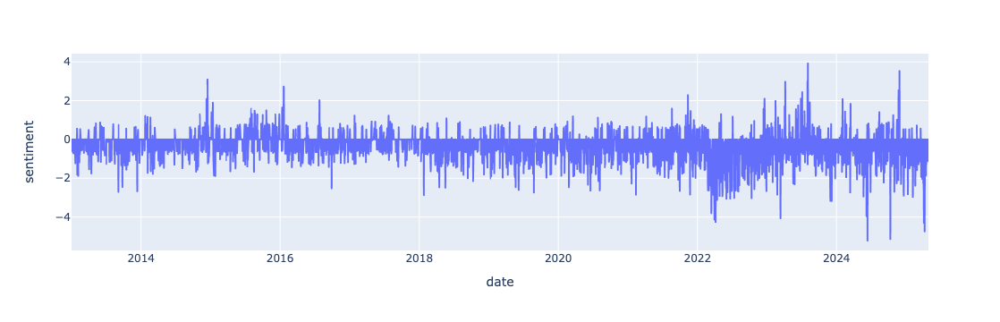

In [79]:
import plotly.express as px

px.line(news_df_v2.groupby('date').apply(lambda x: (x['label']*x['score']).sum()).reset_index(name='sentiment'), x='date', y='sentiment')

In [80]:
agg_sent = news_df_v2.groupby('date').apply(lambda x: (x['label']*x['score']).sum()).reset_index(name='sentiment')

/var/folders/vv/554bsc4n3x96xwcdtn4ch09w0000gn/T/ipykernel_42156/1184619344.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [81]:
agg_sent

,date,sentiment
0,2013-01-01,0.000000
1,2013-01-02,0.000000
2,2013-01-03,-0.529085
3,2013-01-04,-0.572864
4,2013-01-07,-0.626744
...,...,...
3877,2025-04-24,-0.185689
3878,2025-04-25,-1.097708
3879,2025-04-26,0.000000
3880,2025-04-27,0.000000


In [85]:
prepared_w_sent_df = pd.merge(prepared_df, agg_sent, on='date').fillna(0)

In [86]:
prepared_w_sent_df

,ticker,per,date,time,open,high,low,close,vol,target,...,stoch_k,stoch_d,obv,key_rate,cpi,value,brent_close,day_of_week,month,sentiment
0,IMOEX,D,2013-09-02,0,1373.12,1373.33,1366.35,1368.52,7.260675e+06,1371.99,...,18.481086,18.582154,-1.964995e+08,5.5,6.14,33.2474,112.44,0,9,-0.495464
1,IMOEX,D,2013-09-03,0,1368.52,1384.13,1367.73,1371.99,1.721887e+07,1373.62,...,24.606776,18.607495,-1.792807e+08,5.5,6.14,33.2522,113.70,1,9,-0.525408
2,IMOEX,D,2013-09-04,0,1371.99,1375.95,1365.23,1373.62,1.341634e+07,1421.50,...,37.206402,26.764754,-1.658643e+08,5.5,6.14,33.3693,113.23,2,9,-2.705846
3,IMOEX,D,2013-09-05,0,1373.62,1423.47,1373.62,1421.50,2.865636e+07,1421.45,...,97.092251,52.968476,-1.372080e+08,5.5,6.14,33.4656,113.70,3,9,-0.498122
4,IMOEX,D,2013-09-06,0,1421.50,1448.68,1418.83,1421.45,3.822270e+07,1451.61,...,70.707831,68.335495,-1.754307e+08,5.5,6.14,33.3901,114.10,4,9,0.746296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,IMOEX,D,2025-04-14,0,2848.99,2856.63,2806.95,2819.69,1.998655e+07,2805.55,...,36.735033,34.190418,8.898136e+10,21.0,10.34,84.0040,64.82,0,4,-1.335508
2887,IMOEX,D,2025-04-15,0,2824.64,2836.00,2788.26,2805.55,1.882500e+07,2861.83,...,39.336213,38.169321,8.896253e+10,21.0,10.34,82.7671,64.67,1,4,-1.851201
2888,IMOEX,D,2025-04-16,0,2801.01,2870.39,2790.70,2861.83,2.206011e+07,2865.32,...,54.401026,43.490758,8.898459e+10,21.0,10.34,82.3003,65.85,2,4,-1.156469
2889,IMOEX,D,2025-04-17,0,2863.20,2884.76,2844.33,2865.32,2.209345e+07,2872.77,...,59.829808,51.189016,8.900669e+10,21.0,10.34,82.5892,67.96,3,4,-1.257384


In [174]:
prepared_df = aggs_df

13       True
14       True
15       True
16       True
17      False
        ...  
2886     True
2887     True
2888     True
2889     True
2890    False
Name: binary_prediction, Length: 2878, dtype: bool

In [228]:
from sklearn.model_selection import TimeSeriesSplit

def objective(trial):
    params = {
        'depth': trial.suggest_int('depth', 2, 6, step=1),
        'learning_rate': trial.suggest_float('learning_rate', 1e-5, 0.1),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-4, 10),
        'rsm': trial.suggest_categorical('rsm', [0.5, 0.6, 0.7, 0.8]),
        'early_stopping_rounds': trial.suggest_int('early_stopping_rounds', 10, 200, step=10),
        'random_strength': trial.suggest_float('random_strength', 1e-4, 10)
    }
    columns_to_drop = ['target', 'binar_target', 'prediction', 'binary_prediction', 'date', 'ticker', 'per', 'key_rate', 'sentiment', 'sentiment_7d', 'sentiment_30d', 'sentiment_14d']
    tscv = TimeSeriesSplit(n_splits=10)
    mape_scores = []
    roc_auc_list = []
    accuracy_list = []
    accuracy_train_list = []
    prepared_df = aggs_df.dropna()
    prepared_df['date'] = prepared_df['date'].apply(pd.Timestamp)
    prepared_df['day_of_week'] = prepared_df.date.dt.dayofweek
    prepared_df['month'] = prepared_df.date.dt.month
    model = CatBoostClassifier(**params, 
                               verbose=0, 
                               has_time=True, 
                               use_best_model=True, 
                               cat_features=['month', 'day_of_week'])
    for train_index, test_index in tscv.split(prepared_df):
        train_data = prepared_df.iloc[train_index]
        test_data = prepared_df.iloc[test_index]
        # Обучение logreg-a
        X_train = train_data.drop(columns=columns_to_drop, axis=1)
        y_train = train_data['binar_target'].astype(int)
        X_test = test_data.drop(columns=columns_to_drop, axis=1)
        y_true = test_data['binar_target'].astype(int)
        model.fit(X_train, y_train, eval_set=(X_test, y_true))
        # Прогноз на тестовой выборке
        predictions = model.predict(X_test)
        # Расчет метрик
        acc_val = accuracy_score(y_true, predictions)
        acc_train = accuracy_score(y_train, model.predict(X_train))
        accuracy_list.append(acc_val)
        roc = roc_auc(y_true, model.predict_proba(X_test)[::, 1])
        accuracy_train_list.append(acc_train)
        roc_auc_list.append(roc)
    
    return np.mean(roc_auc_list)

In [229]:
from catboost import CatBoostClassifier

In [230]:
import optuna
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=500, n_jobs=-1,)

[I 2025-05-20 23:46:44,488] A new study created in memory with name: no-name-63705384-ec75-43cd-81d0-786cb563e312
[I 2025-05-20 23:46:45,428] Trial 3 finished with value: 0.5313023280991062 and parameters: {'depth': 2, 'learning_rate': 0.04896885243585471, 'l2_leaf_reg': 5.322247287814119, 'rsm': 0.7, 'early_stopping_rounds': 10, 'random_strength': 8.931999446119598}. Best is trial 3 with value: 0.5313023280991062.
[I 2025-05-20 23:46:45,984] Trial 6 finished with value: 0.5401542759165971 and parameters: {'depth': 5, 'learning_rate': 0.04183151380337092, 'l2_leaf_reg': 1.6713533538126977, 'rsm': 0.5, 'early_stopping_rounds': 20, 'random_strength': 1.7075048465994767}. Best is trial 6 with value: 0.5401542759165971.
[I 2025-05-20 23:46:46,188] Trial 8 finished with value: 0.535145183441043 and parameters: {'depth': 2, 'learning_rate': 0.0957314704346468, 'l2_leaf_reg': 8.05111012508355, 'rsm': 0.6, 'early_stopping_rounds': 40, 'random_strength': 5.672941862915337}. Best is trial 6 with

In [237]:
study.best_params

{'depth': 4,
 'learning_rate': 0.06435333798120918,
 'l2_leaf_reg': 7.153518235443431,
 'rsm': 0.5,
 'early_stopping_rounds': 100,
 'random_strength': 4.411158285233278}

In [231]:
columns_to_drop = ['target', 'binar_target', 'prediction', 'binary_prediction', 'date', 'ticker', 'per', 'key_rate', 'sentiment', 'sentiment_7d', 'sentiment_30d', 'sentiment_14d']
tscv = TimeSeriesSplit(n_splits=10)
mape_scores = []
roc_auc_list = []
accuracy_list = []
accuracy_train_list = []
prepared_df = aggs_df.dropna()
prepared_df['date'] = prepared_df['date'].apply(pd.Timestamp)
prepared_df['day_of_week'] = prepared_df.date.dt.dayofweek
prepared_df['month'] = prepared_df.date.dt.month
model = CatBoostClassifier(**study.best_params, 
                           verbose=0, 
                           has_time=True, 
                           use_best_model=True, 
                           cat_features=['month', 'day_of_week'])
for train_index, test_index in tscv.split(prepared_df):
    train_data = prepared_df.iloc[train_index]
    test_data = prepared_df.iloc[test_index]
    # Обучение logreg-a
    X_train = train_data.drop(columns=columns_to_drop, axis=1)
    y_train = train_data['binar_target'].astype(int)
    X_test = test_data.drop(columns=columns_to_drop, axis=1)
    y_true = test_data['binar_target'].astype(int)
    model.fit(X_train, y_train, eval_set=(X_test, y_true))
    # Прогноз на тестовой выборке
    predictions = model.predict(X_test)
    # Расчет метрик
    acc_val = accuracy_score(y_true, predictions)
    acc_train = accuracy_score(y_train, model.predict(X_train))
    accuracy_list.append(acc_val)
    roc = roc_auc(y_true, model.predict_proba(X_test)[::, 1])
    accuracy_train_list.append(acc_train)
    roc_auc_list.append(roc)

In [232]:
roc_auc_list

[0.5757629315423589,
 0.6096594245449207,
 0.5209630064591897,
 0.5650725321382238,
 0.5587987987987988,
 0.5855826397146254,
 0.5435601601130209,
 0.5510863182618908,
 0.5520202020202021,
 0.5998823529411764]

In [243]:
np.mean(accuracy_train_list)

0.6058416691204536

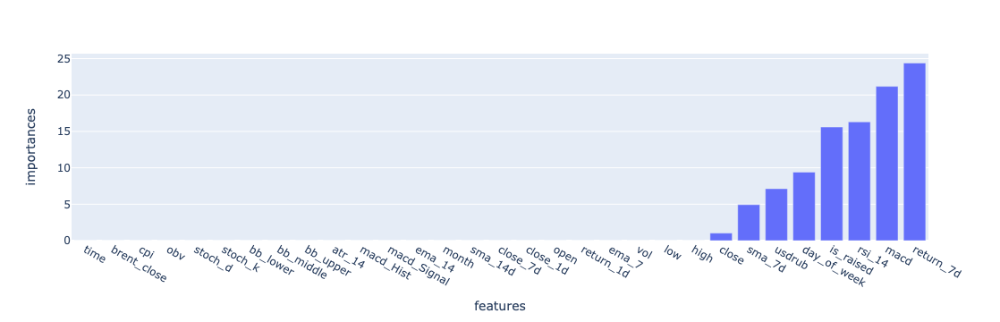

In [244]:
px.bar(pd.DataFrame({'features': model.feature_names_, 'importances': model.feature_importances_}).replace({'value': 'usdrub'}).sort_values('importances'), x='features', y='importances')

In [221]:
model.feature_importances_

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        , 36.37204993,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        , 10.58525111,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        , 14.80204508,  0.        , 29.73609241,
        8.50456147])